In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import json
import scvi
import seaborn as sns
import matplotlib.cm as cm


from utils import preprocessing

TISSUE = "Striatum"

ADATA = f"/home/gdallagl/myworkdir/XDP/data/XDP/NucSec/adatas/{TISSUE}/{TISSUE}_combined_QC_mmc.h5ad"

SAMPLE_VARIABLE = "donor_id"

SAVE_PATH = f"{os.path.splitext(ADATA)[0]}_ct-cured.h5ad"

# Process one tissue at a time

In [ ]:
adata = sc.read_h5ad(ADATA)
print(adata)


AnnData object with n_obs × n_vars = 231080 × 38601
    obs: 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'barcode', 'bcl', 'rna_index', 'library', 'library__barcode', 'frac_mito', 'mol_info_nUMI', 'mol_info_nRead', 'frac_intronic', 'donor_id', 'vireo_prob_max', 'vireo_prob_doublet', 'vireo_n_vars', 'vireo_best_singlet', 'vireo_best_doublet', 'vireo_doublet_logLikRatio', 'dropsift_frac_contamination', 'dropsift_training_label_is_cell', 'dropsift_empty_gene_module_score', 'dropsift_is_cell', 'dropsift_is_cell_prob', 'cell_class', 'leiden_0.1', 'leiden_0.2', 'leiden_0.3', 'leiden_0.4', 'leiden_0.5', 'tissue', 'broad_original_cell_type', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'brain_bank', 'cohort', 'condition', 'sex', 'age_of_on

In [2]:
def preprocess_common_pipeline(adata, umap_name="", leiden_name="", resolutions=[0.1, 0.5, 0.07], integrate_with_harmony=False, integrate_with_scvi=False, batch_key=None, categorical_covariate_keys=None):

    SEED =42
    
    adata.X = adata.layers["counts"].copy()
    sc.pp.normalize_total(adata, target_sum=1e4, inplace=True)
    sc.pp.log1p(adata)
    adata.layers["log1p_norm"] = adata.X.copy()

    # Cehck that all abtcjes have enight cells, otheriw use usail hvg method
    print("Running HVG...")
    try:
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3", 
                                     layer="counts", batch_key=batch_key)
        print(f"HVG computed with batch_key='{batch_key}'")
    except ValueError as e:
        print(f"WARNING: HVG with batch_key failed ({e}), retrying without batch_key")
        sc.pp.highly_variable_genes(adata, n_top_genes=3000, flavor="seurat_v3", 
                                     layer="counts", batch_key=None)

    if integrate_with_scvi:
        import scvi
        # Train scVI
        adata_hvg = adata[:, adata.var.highly_variable].copy()  # temp copy, HVG only
        scvi.model.SCVI.setup_anndata(adata_hvg, layer="counts", batch_key=batch_key, categorical_covariate_keys=categorical_covariate_keys)
        model = scvi.model.SCVI(adata_hvg, n_layers=2, n_latent=30)
        model.train(batch_size=512, max_epochs=50)# datasplitter_kwargs={'num_workers': 16})

        loss_key = "elbo_train" if "elbo_train" in model.history else "train_loss_epoch"
        plt.plot(model.history[loss_key]); plt.xlabel("Epoch"); plt.ylabel("Loss"); plt.show()

        adata.obsm["X_scvi"] = model.get_latent_representation()
        sc.pp.neighbors(adata, use_rep="X_scvi", random_state=SEED)
        sc.tl.umap(adata, key_added=f"umap{umap_name}", random_state=SEED)

    elif integrate_with_harmony:
        print("Running Harmony...")
        import harmonypy
        if batch_key is None:
            raise ValueError("batch_key must be provided for Harmony integration.")
        sc.pp.scale(adata, max_value=10)
        sc.tl.pca(adata, svd_solver='arpack', n_comps=50, random_state=SEED)
        # Run Harmony on the PCA embedding
        ho = harmonypy.run_harmony(adata.obsm["X_pca"], adata.obs, vars_use=batch_key, max_iter_harmony=30)
        adata.obsm["X_pca_harmony"] = ho.Z_corr
        sc.pp.neighbors(adata, use_rep="X_pca_harmony", n_pcs=30, random_state=SEED)
        sc.tl.umap(adata, key_added=f"umap{umap_name}", random_state=SEED)
        
    else:
        sc.pp.scale(adata, max_value=10) #z-score normalization
        sc.tl.pca(adata, svd_solver='arpack', n_comps=50, random_state=SEED)
        sc.pp.neighbors(adata, use_rep='X_pca', n_pcs=30, random_state=SEED) # from X_pca
        sc.tl.umap(adata, key_added=f"umap{umap_name}", random_state=SEED) # uese neighbors

    for r in resolutions:
        sc.tl.leiden(adata, resolution=r, key_added=f"leiden_{r}{leiden_name}", flavor="igraph", n_iterations=2, random_state=SEED) # use neighbors
    leiden_cluster_names = [f"leiden_{r}{leiden_name}" for r in resolutions]

    adata.X = adata.layers["counts"].copy()  # restore original log1p-normalized data in adata.X
    
    return leiden_cluster_names

def which_clusters_are_split(adata, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL, CLEAN_THRESHOLD = 90):

    ct_per_cluster = (
        adata.obs
        .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])
        .size() # eaw counts
        .unstack(fill_value=0) 
    )
    ct_per_cluster_pct = ct_per_cluster.div(ct_per_cluster.sum(axis=1), axis=0) * 100 # cal pct

    fig, ax = plt.subplots(figsize=(12, 6))
    sns.heatmap(ct_per_cluster_pct, annot=True, fmt=".0f", cmap="Blues",
                cbar_kws={"label": "% of cluster"}, ax=ax)
    ax.set_title(f"{CLUSTERS_GROUP_ALL_CELLS_COL} x {MMC_ANNOTATION_LEVEL}  (% of cluster)")
    ax.set_xlabel("MMC label"); ax.set_ylabel("Cluster")
    plt.tight_layout(); plt.show()

    # for each clutser applu ruels to say if it ok or need ot investigate
    #CLEAN_THRESHOLD = 90   # % to call a cluster "clean"

    cluster_status = {}
    for cluster, row in ct_per_cluster_pct.iterrows():
        top_label  = row.idxmax()
        top_pct    = row.max()
        if top_pct >= CLEAN_THRESHOLD:
            status = "clean"
        else:
            status = "INVESTIGATE"   # mixed → check marker genes manually
        cluster_status[cluster] = {"top_label": top_label, "top_pct": top_pct, "status": status}

    cluster_status_df = pd.DataFrame(cluster_status).T
    display(cluster_status_df)


subclass_cell_types_mapping = {
    "MSN": [
        "STR D1 MSN", "STR D2 MSN", "STR Hybrid MSN",
    ],
    "non_MSN_neuron": [
        "ACx MEIS2 GABA", "CN Cholinergic GABA", "CN GABA-Glut",
        "CN LAMP5-CXCL14 GABA", "CN LAMP5-LHX6 GABA", "CN LHX8 GABA",
        "CN MEIS2 GABA", "CN ONECUT1 GABA", "CN ST18 GABA", "CN VIP GABA",
        "F GABA", "F Glut", "F M GATA3 GABA", "F M Glut", "M Dopa",
        "OT Granular GABA", "SN PAX7 GABA", "STR SST-CHODL GABA","STR RSPO2 GABA"
    ],
    "glia": [
        "Astrocyte", "COP", "Ependymal", "Oligodendrocyte", "OPC"
    ],
    "vascular": [
        "Endo", "Pericyte", "SMC", "VLMC"
    ],
    "immune": [
        "Lymphocyte", "Macrophage", "Microglia"
    ],
}

# reverse map: cell type → broad category (useful for adata.obs)
celltype_to_broad = {
    cell: broad
    for broad, cells in subclass_cell_types_mapping.items()
    for cell in cells
}

markers_ct = {
    "Oligodendrocytes":     ["MBP", "MOG", "PLP1", "CNP", "OLIG2"],
    "Astrocytes":           ["GFAP", "AQP4", "ALDH1L1", "SLC1A2"],
    
    "Endothelial_BBB":      ["CLDN5", "OCLN", "SLC2A1", "MFSD2A"],  
    "Pericytes":            ["ABCC9", "RGS5", "KCNJ8", "IFITM1"],  
    "Fibroblasts":          ["PDGFRA", "DCN", "LUM", "COL1A1"],
    "SmoothMuscleCells":    ["MYH11", "CNN1", "MYOCD", "TAGLN"],

    "Microglia":            ["P2RY12", "TMEM119", "FCRLS", "SALL1"],
    "Monocytes":            ["CCR2", "LY6C2", "S100A8", "S100A9", "CD300E"],
    "Macrophages":          ["MRC1", "LYVE1", "CD163", "LGALS3", "CD200R1"],

    "Tcells":               ["CD3D", "CD3E", "CD8A", "GZMB"],
    "Bcells":               ["CD19", "MS4A1", "CD79A", "CD79B"],

    "Proliferating":        ["MKI67", "TOP2A", "PCNA", "CDK1"],
    "DendriticCells":       ["CD1C", "FCER1A", "CLEC4C", "IRF7"],
    "Dissociation_Stress":  ["FOS", "JUN", "DUSP1", "HIF1A"],
}


In [ ]:
# Preprocess
leiden_cluster_names = preprocess_common_pipeline(adata, leiden_name="_all_cells", integrate_with_harmony=True, batch_key="library")

Running HVG...
HVG computed with batch_key='library'
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)


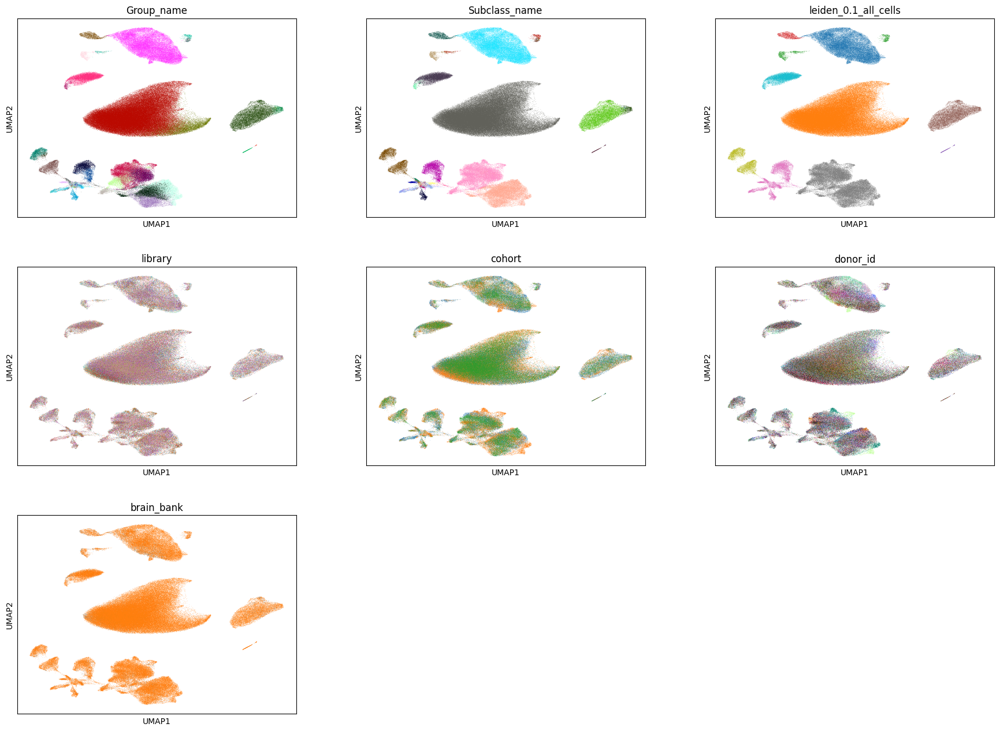

In [5]:
sc.pl.umap(adata, color=["Group_name", "Subclass_name", leiden_cluster_names[0], "library", "cohort", "donor_id", "brain_bank"], ncols=3, legend_loc=None)

# Glia - Astrocyte

In [6]:
# CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
# CLUSTERS_GROUP_ALL_CELLS =  ["0"]
# MMC_ANNOTATION_LEVEL = "Subclass_name"
# GROUP_LABELS = subclass_cell_types_mapping["glia"]
# NAME="_glia_astrocytes"

# # to help  picking clusters
# fig, ax = plt.subplots(1, 3, figsize=(20,5))
# sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
# sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
# sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
# plt.tight_layout(); plt.show()

In [7]:
# # Select clear nn clusters (use cluster created using all cells)
# adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# # rerun analsys
# leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.5, 1.0], integrate_with_harmony=True, batch_key="library") #sample_id has too many batches with too few cells eac

# # plot umap
# sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

In [8]:
# # Check for cell subtype markers

# CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.1{NAME}"

# # mmc cell types
# which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

# # Wilcoxon
# res = preprocessing.rank_markers_per_cluster(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, layer="log1p_norm", n_genes=10, markers=markers_ct)
# for cluster, df in res.items():
#     print(f"Cluster {cluster}:")
#     display(df)

# # gene markers score
# col_scores = preprocessing.calculate_and_plot_markers(adata_nn, markers_ct, ncol=3, layer="log1p_norm", color_map="Reds", umap_name=f"umap{NAME}", vmin=-1, vmax=2)

# # plot clusters
# sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data")

# """

# """

# Glia

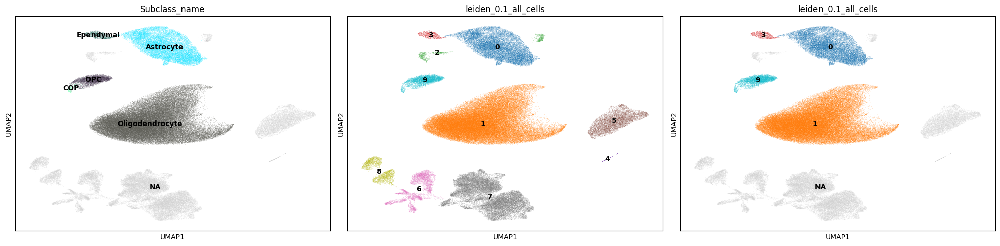

In [9]:
CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
CLUSTERS_GROUP_ALL_CELLS =  ["0", "1", "3", "9"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["glia"]
NAME="_glia"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

Running HVG...
HVG computed with batch_key='library'
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-05 23:03:50,831 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-05 23:03:50,832 - harmonypy - INFO -   Parameters:
2026-03-05 23:03:50,832 - harmonypy - INFO -     max_iter_harmony: 30
2026-03-05 23:03:50,833 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-05 23:03:50,833 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-05 23:03:50,834 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-05 23:03:50,834 - harmonypy - INFO -     nclust: 100
2026-03-05 23:03:50,835 - harmonypy - INFO -     block_size: 0.05
2026-03-05 23:03:50,836 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-03-05 23:03:50,837 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-03-05 23:03:50,837 - harmonypy - INFO -     sigma:

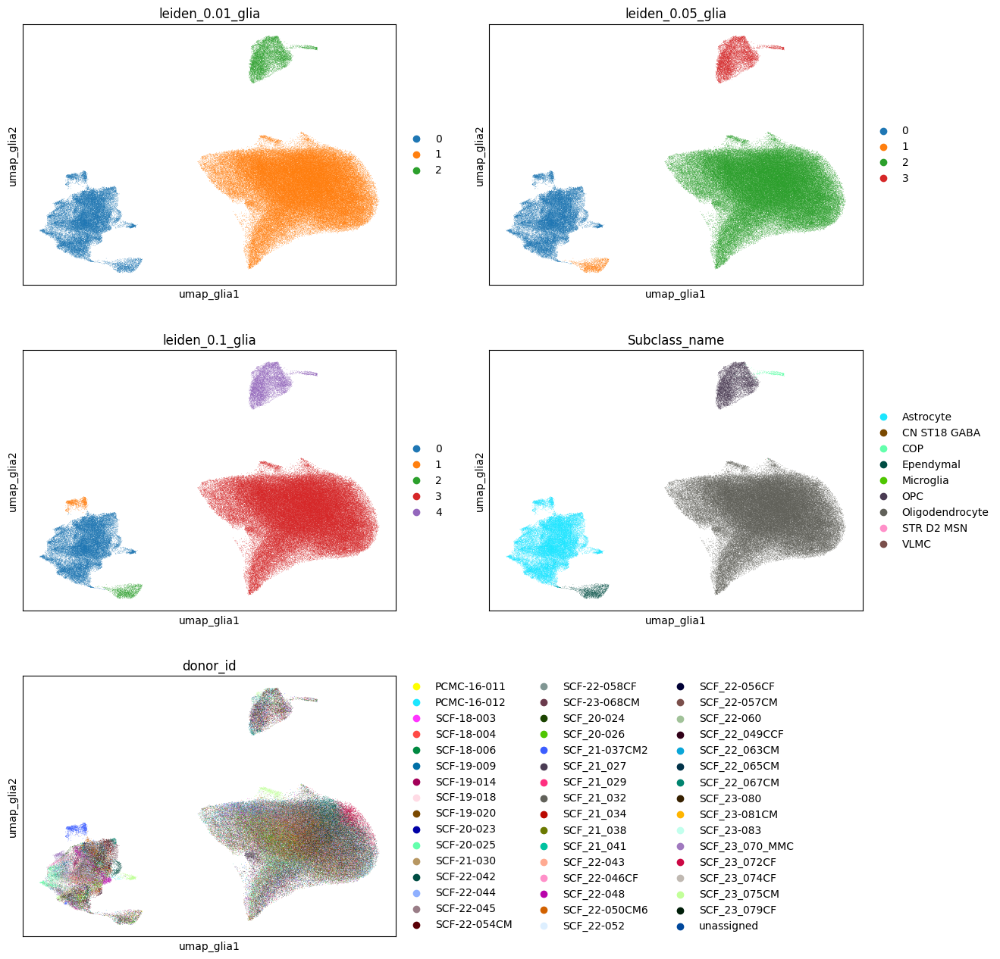

In [13]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.01, 0.05, 0.1], integrate_with_harmony=True, batch_key="library")

# plot umap
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

/tmp/ipykernel_60870/3187771005.py:67: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])


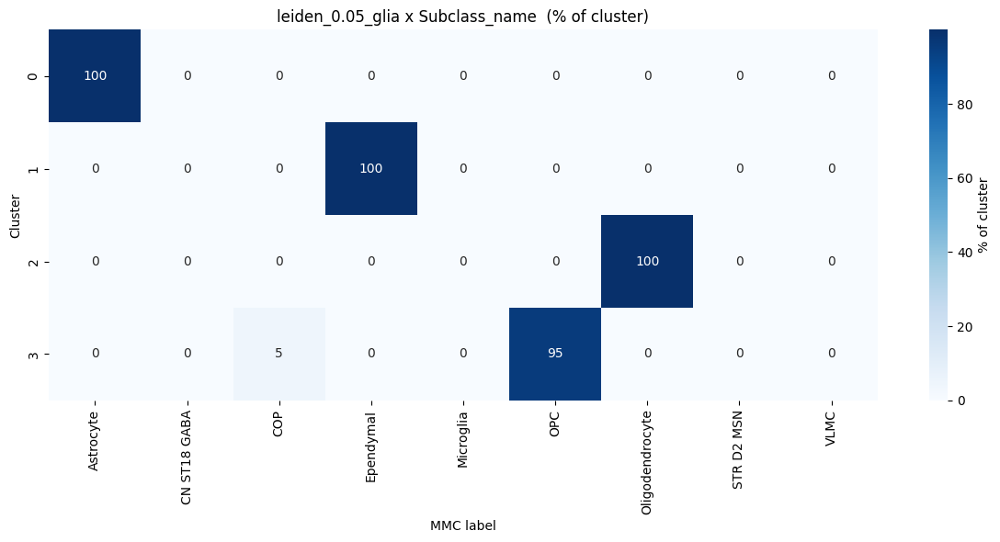

,top_label,top_pct,status
0,Astrocyte,99.823159,clean
1,Ependymal,99.865862,clean
2,Oligodendrocyte,99.994326,clean
3,OPC,95.352544,clean


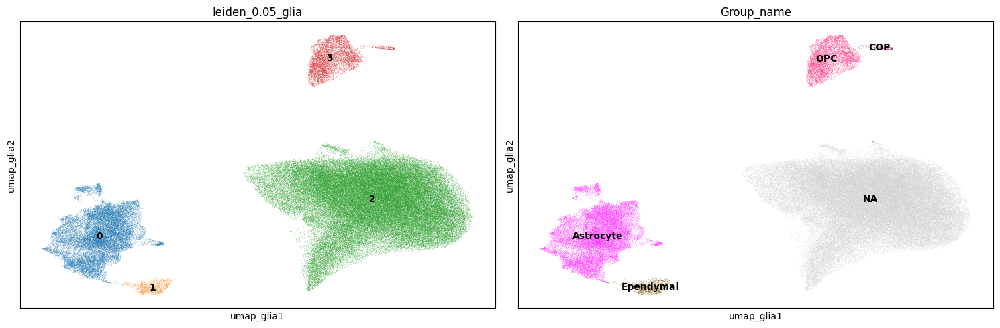

In [16]:
###########
### Cluster analysys (see if in unsupervosed clusters the cell types by mmc are coherent)
###########
CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.05{NAME}"

which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data", ax=axes[0], show=False)
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="Group_name", groups=GROUP_LABELS, legend_loc="on data", ax=axes[1], show=False)
plt.tight_layout()
plt.show()

### Final decision

Suppress COP.

/tmp/ipykernel_60870/4064712390.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '['Astrocyte', 'Astrocyte', 'Astrocyte', 'Astrocyte', 'Astrocyte', ..., 'Oligodendrocyte', 'Oligodendrocyte', 'Oligodendrocyte', 'Oligodendrocyte', 'Oligodendrocyte']
Length: 162425
Categories (4, object): ['Astrocyte', 'Ependymal', 'Oligodendrocyte', 'OPC']' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


ct_for_deg
Oligodendrocyte    123374
Astrocyte           29405
OPC                  8155
Ependymal            1491
Name: count, dtype: int64


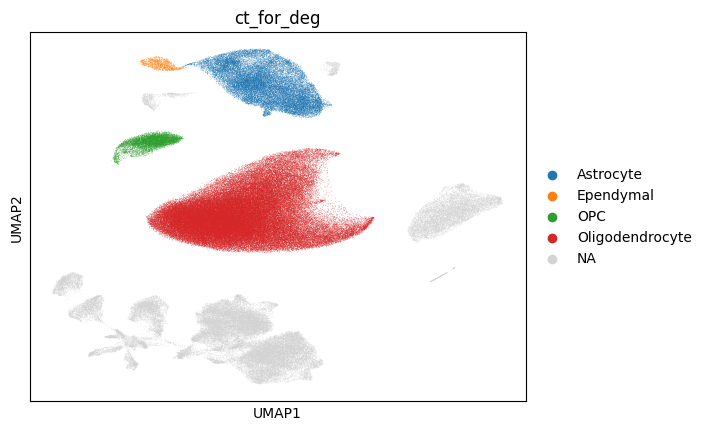

In [17]:

# map clusters to yout ct
mapping_dict = {
    "0": "Astrocyte",
    "1": "Ependymal",
    "2": "Oligodendrocyte", 
    "3": "OPC"
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict)

# Add to orignla ct
if "ct_for_deg" not in adata.obs.columns:
    adata.obs["ct_for_deg"] = np.nan
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")

In [18]:
del adata_nn

# Vascular

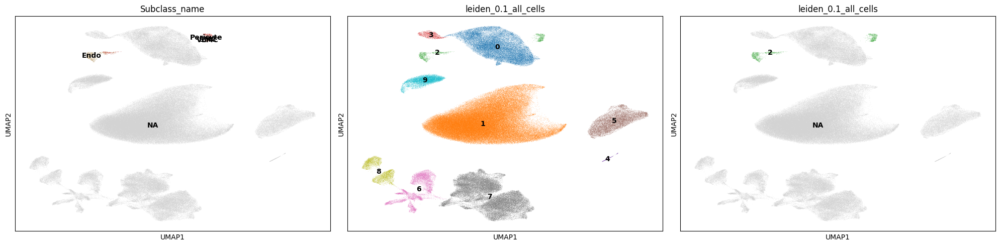

In [19]:
CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
CLUSTERS_GROUP_ALL_CELLS =  ["2"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["vascular"]
NAME="_vascular"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

Running HVG...
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-05 23:11:42,743 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-05 23:11:42,744 - harmonypy - INFO -   Parameters:
2026-03-05 23:11:42,745 - harmonypy - INFO -     max_iter_harmony: 30
2026-03-05 23:11:42,746 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-05 23:11:42,747 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-05 23:11:42,748 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-05 23:11:42,748 - harmonypy - INFO -     nclust: 56
2026-03-05 23:11:42,749 - harmonypy - INFO -     block_size: 0.05
2026-03-05 23:11:42,750 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-03-05 23:11:42,752 - harmonypy - INFO -     theta: [2. 2. 2. 2.

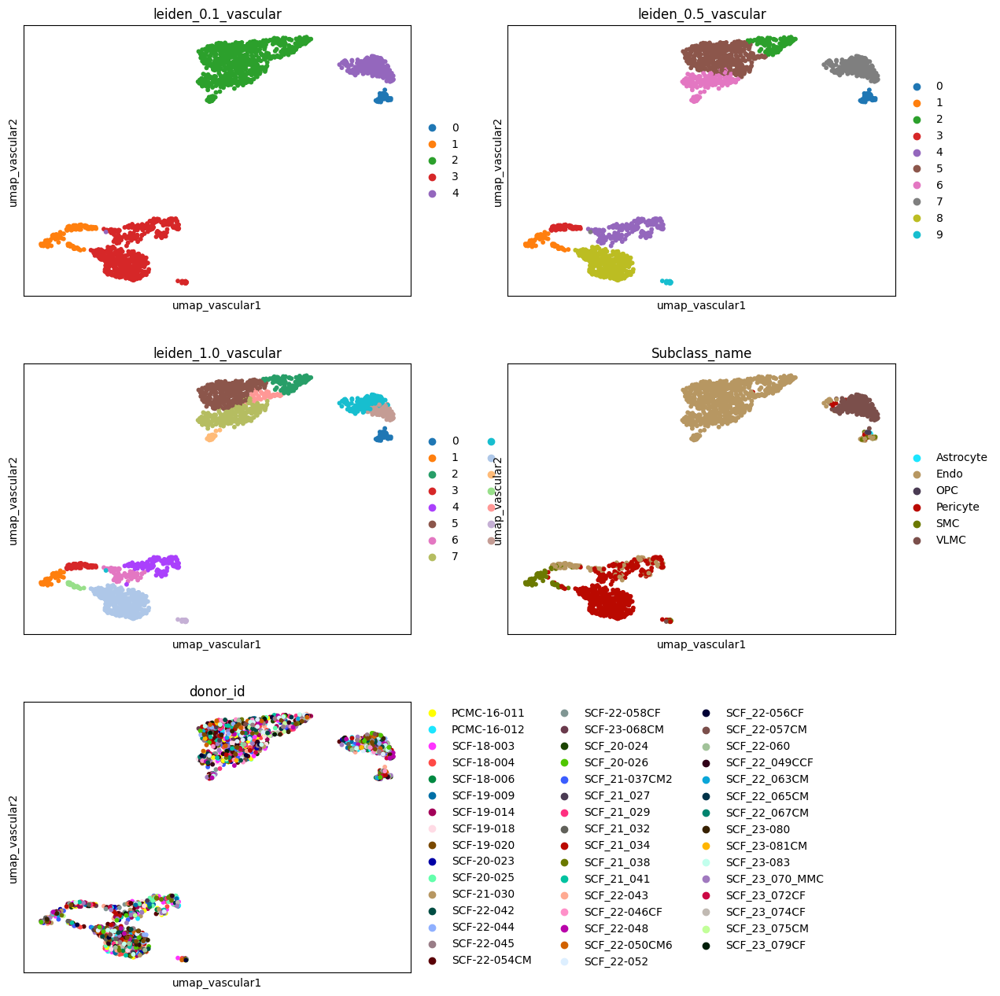

In [20]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.5, 1.0], integrate_with_harmony=True, batch_key=SAMPLE_VARIABLE)

# plot umap
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

/tmp/ipykernel_60870/3187771005.py:67: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby([CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL])


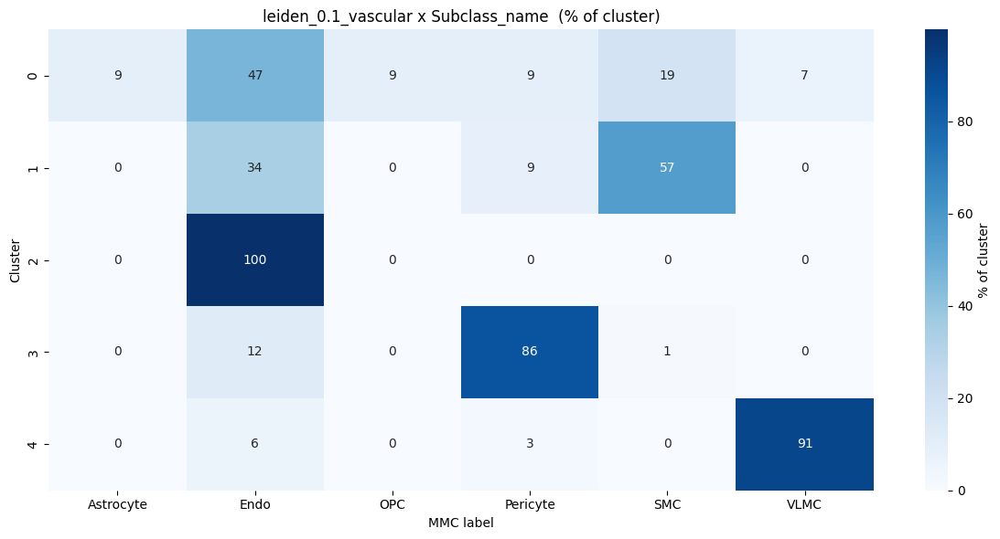

,top_label,top_pct,status
0,Endo,46.511628,INVESTIGATE
1,SMC,57.364341,INVESTIGATE
2,Endo,99.862259,clean
3,Pericyte,86.256781,INVESTIGATE
4,VLMC,91.341991,clean


Cluster 0:


,names,scores,logfoldchanges,pvals,pvals_adj,cell_type
0,ENSG00000156475,10.179403,5.439776,2.450585e-24,9.459502e-20,
1,ENSG00000169306,9.892185,5.400427,4.500947e-23,6.885503e-19,
2,ENSG00000154654,9.874850,5.409947,5.351289e-23,6.885503e-19,
3,ENSG00000151150,9.777043,6.973300,1.412776e-22,1.363364e-18,
4,ENSG00000197971,9.700706,5.131282,2.994197e-22,2.311580e-18,
5,ENSG00000184226,9.639955,4.965775,5.421211e-22,3.487736e-18,
6,ENSG00000187164,9.551848,5.477738,1.274025e-21,7.025521e-18,
7,ENSG00000145416,9.358779,5.874965,8.066342e-21,3.892111e-17,
8,ENSG00000149294,9.312658,5.694808,1.246718e-20,5.347175e-17,
9,ENSG00000135905,9.288803,4.232584,1.560328e-20,6.023021e-17,


Cluster 1:


,names,scores,logfoldchanges,pvals,pvals_adj,cell_type
0,ENSG00000133392,16.682653,7.416312,1.752557e-62,6.765043e-58,
1,ENSG00000172572,16.257803,4.233224,1.966625e-59,3.795684e-55,
2,ENSG00000076706,15.928224,4.088246,4.036628e-57,5.193929e-53,
3,ENSG00000184347,15.860685,5.685303,1.185930e-56,1.144452e-52,
4,ENSG00000182732,15.743247,4.586909,7.641903e-56,5.899702e-52,
5,ENSG00000140836,15.306134,2.991638,6.957839e-53,4.476326e-49,
6,ENSG00000149591,15.036736,3.735084,4.218487e-51,2.326254e-47,
7,ENSG00000107796,14.808180,4.616043,1.297054e-49,6.258449e-46,
8,ENSG00000107242,14.593396,3.930285,3.094036e-48,1.327032e-44,
9,ENSG00000185532,14.322110,3.748313,1.592137e-46,6.145806e-43,


Cluster 2:


,names,scores,logfoldchanges,pvals,pvals_adj,cell_type
0,ENSG00000085563,29.163843,3.901772,5.576947e-187,3.075368e-183,
1,ENSG00000276550,28.998734,3.271610,6.825982e-185,2.634897e-181,
2,ENSG00000164181,28.891752,3.868028,1.515681e-183,5.318801e-180,
3,ENSG00000206190,27.938292,3.644987,9.147581e-172,2.354038e-168,
4,ENSG00000110799,27.587700,3.677293,1.563053e-167,3.549142e-164,
5,ENSG00000180229,27.266958,3.794845,1.046103e-163,2.125296e-160,
6,ENSG00000184005,27.138388,3.771835,3.471773e-162,6.700696e-159,
7,ENSG00000088387,27.121664,2.671155,5.468464e-162,1.005182e-158,
8,ENSG00000151702,26.026253,3.157065,2.498954e-149,3.326280e-146,
9,ENSG00000085276,25.963160,3.590338,1.291529e-148,1.661811e-145,


Cluster 3:


,names,scores,logfoldchanges,pvals,pvals_adj,cell_type
0,ENSG00000164741,29.857897,3.624137,6.933178e-196,2.676276e-191,
1,ENSG00000113231,29.775396,5.039476,8.136668e-195,1.570418e-190,
2,ENSG00000173638,28.421246,4.158484,1.104952e-177,1.421742e-173,
3,ENSG00000113721,27.956699,3.693705,5.465131e-172,5.273988e-168,
4,ENSG00000171408,27.804415,4.047874,3.835981e-170,2.961454e-166,
5,ENSG00000179399,27.401745,4.933607,2.614306e-165,1.681914e-161,
6,ENSG00000157103,27.071529,3.793245,2.131255e-161,1.175265e-157,
7,ENSG00000018625,26.952694,3.391962,5.304170e-160,2.559328e-156,
8,ENSG00000179097,26.571825,4.307673,1.437206e-155,6.164177e-152,
9,ENSG00000160801,26.117165,4.276804,2.327501e-150,8.984385e-147,


Cluster 4:


,names,scores,logfoldchanges,pvals,pvals_adj,cell_type
0,ENSG00000154258,23.347143,5.251548,1.473418e-120,5.687543e-116,
1,ENSG00000122870,22.384090,6.820941,5.624223e-111,1.085503e-106,
2,ENSG00000185070,22.278931,7.868623,5.915257e-110,7.611161e-106,
3,ENSG00000215386,22.022890,4.492809,1.738175e-107,1.447334e-103,
4,ENSG00000140538,22.019463,4.494119,1.874737e-107,1.447334e-103,
5,ENSG00000249307,21.831898,6.659942,1.155218e-105,7.432095e-102,
6,ENSG00000103888,21.795946,7.039137,2.534989e-105,1.397902e-101,
7,ENSG00000187147,21.556240,4.979920,4.627039e-103,2.232604e-99,
8,ENSG00000196569,20.771418,3.914337,7.850757e-96,3.367189e-92,
9,ENSG00000077942,20.439024,4.608008,7.522987e-93,2.903948e-89,


Assure that adata.var.index has same gene name of makers...


  0%|          | 0/14 [00:00<?, ?it/s]

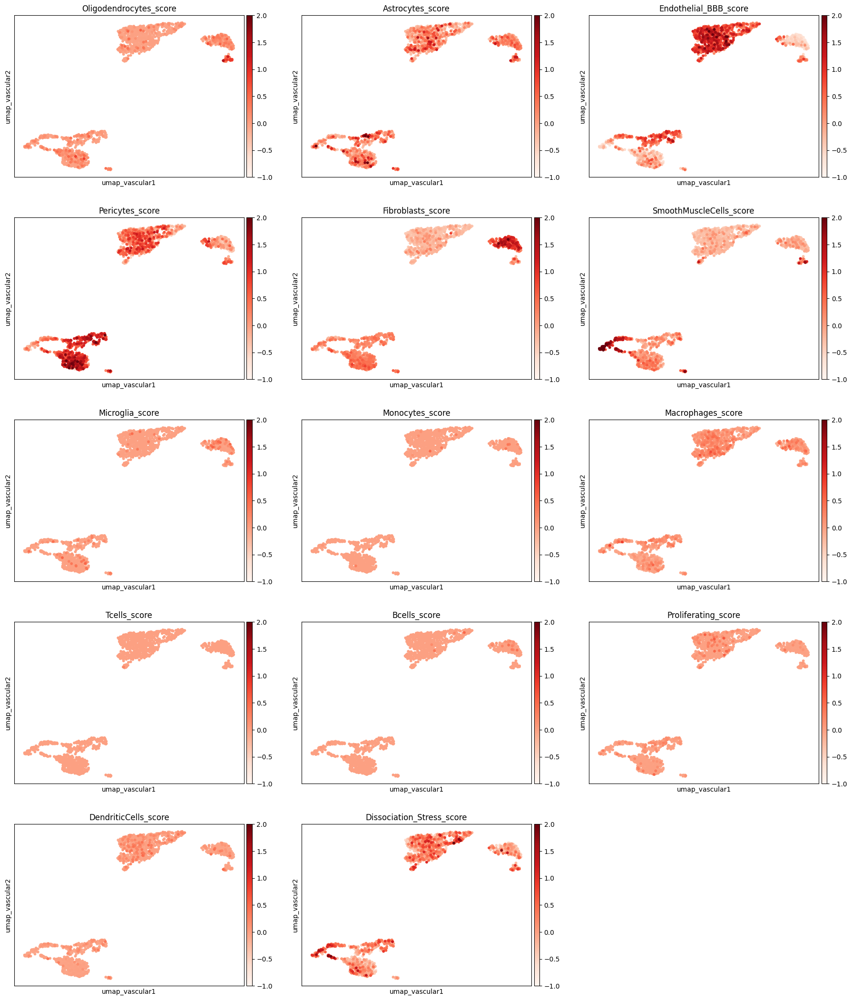

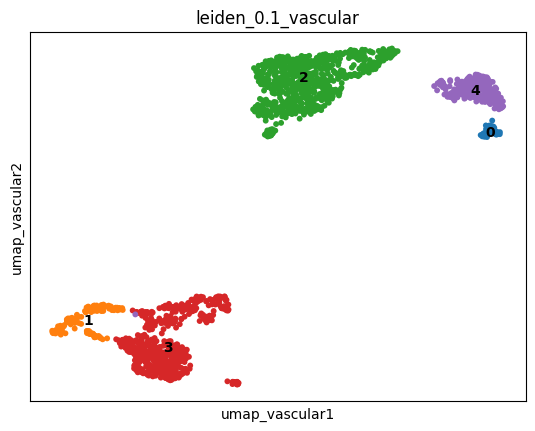

'\nVASCUALAR\n    - BBB\n    - Pericytes\n    - Fibroblasts\n    - SmoothMuscleCells\n'

In [22]:
# Check for cell subtype markers

CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.1{NAME}"

# mmc cell types
which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

# Wilcoxon
res = preprocessing.rank_markers_per_cluster(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, layer="log1p_norm", n_genes=10, markers=markers_ct)
for cluster, df in res.items():
    print(f"Cluster {cluster}:")
    display(df)

# gene markers score
col_scores = preprocessing.calculate_and_plot_markers(adata_nn, markers_ct, gene_col="gene_symbol", ncol=3, layer="log1p_norm", color_map="Reds", umap_name=f"umap{NAME}", vmin=-1, vmax=2)

# plot clusters
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data")

"""
VASCUALAR
    - BBB
    - Pericytes
    - Fibroblasts
    - SmoothMuscleCells
"""

### Final decision

ct_for_deg
Oligodendrocyte         123374
Astrocyte                29405
OPC                       8155
Ependymal                 1491
Endothelial_BBB            726
Pericytes                  553
Fibroblasts                231
SmoothMuscleCells          129
-Oligo_contamination        43
Name: count, dtype: int64


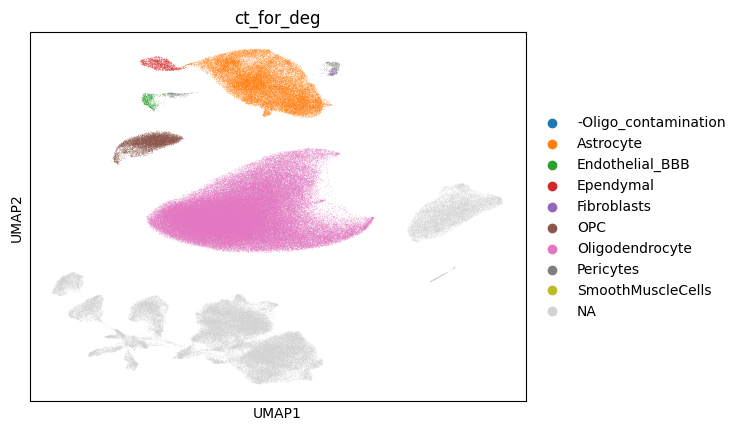

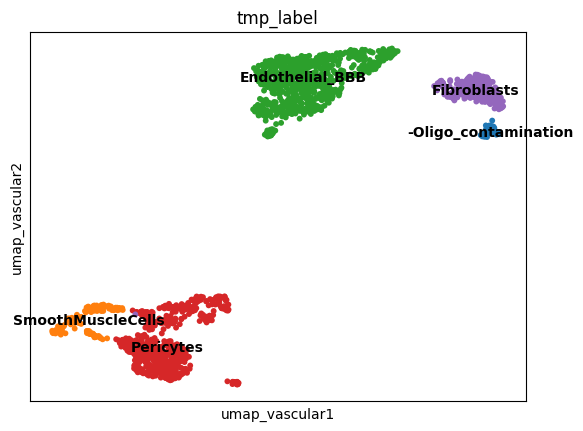

In [23]:
# map clusters to yout ct
mapping_dict = {
    "0": "-Oligo_contamination",
    "1": "SmoothMuscleCells",
    "2": "Endothelial_BBB", 
    "3": "Pericytes",
    "4": "Fibroblasts"
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict)

# Add to orignla ct
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align

print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="tmp_label", legend_loc="on data")


# Immune

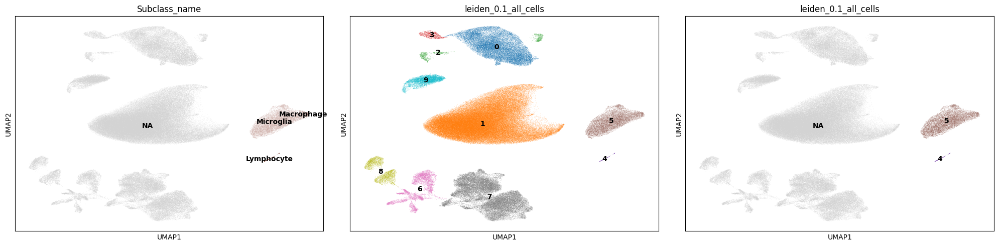

In [24]:
CLUSTERS_ALL_CELLS_COL = "leiden_0.1_all_cells"
CLUSTERS_GROUP_ALL_CELLS =  ["5", "4"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["immune"]
NAME="_immune"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data", palette="tab20")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

Running HVG...
HVG computed with batch_key='library'
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-05 23:19:45,497 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-05 23:19:45,498 - harmonypy - INFO -   Parameters:
2026-03-05 23:19:45,499 - harmonypy - INFO -     max_iter_harmony: 30
2026-03-05 23:19:45,500 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-05 23:19:45,500 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-05 23:19:45,501 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-05 23:19:45,502 - harmonypy - INFO -     nclust: 100
2026-03-05 23:19:45,503 - harmonypy - INFO -     block_size: 0.05
2026-03-05 23:19:45,504 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-03-05 23:19:45,505 - harmonypy - INFO -     theta: [2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.]
2026-03-05 23:19:45,506 - harmonypy - INFO -     sigma:

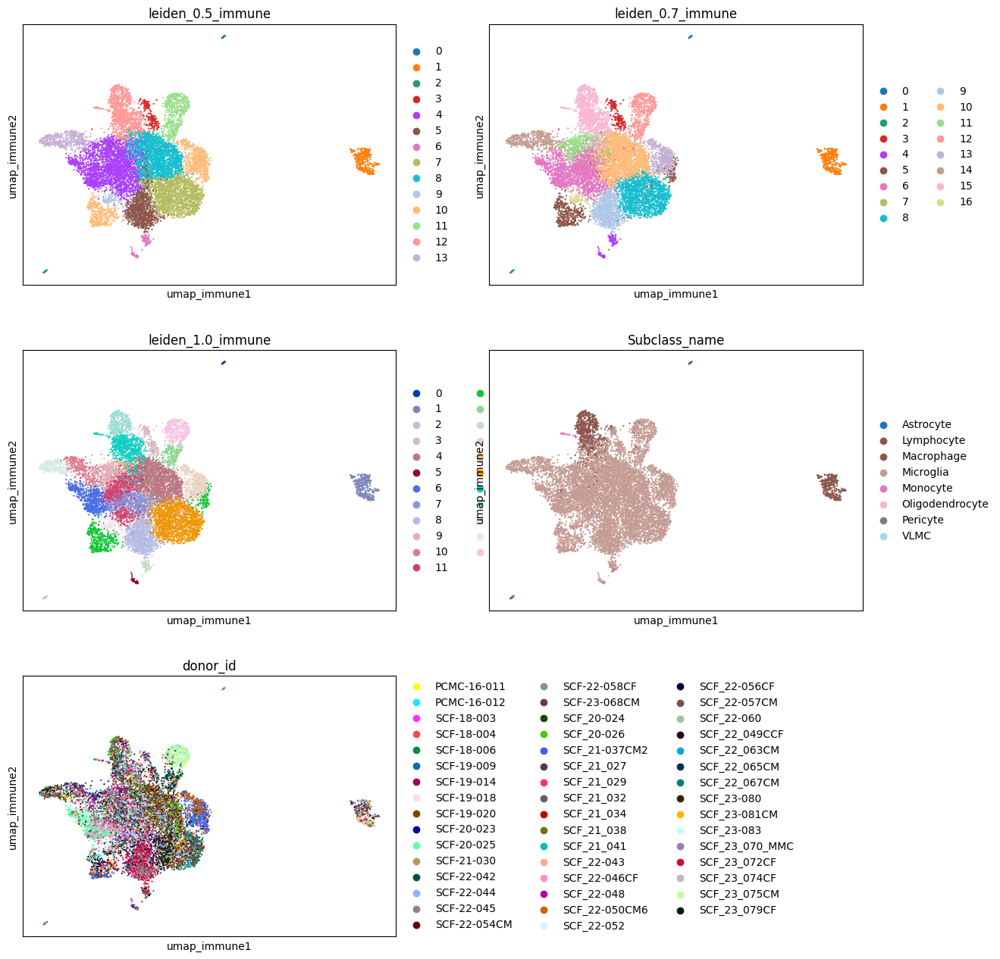

In [29]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.5, 0.7, 1.0], integrate_with_harmony=True, batch_key="library")

# plot umap
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=[*leiden_cluster_names, MMC_ANNOTATION_LEVEL, SAMPLE_VARIABLE], ncols=2)

Assure that adata.var.index has same gene name of makers...


  0%|          | 0/14 [00:00<?, ?it/s]

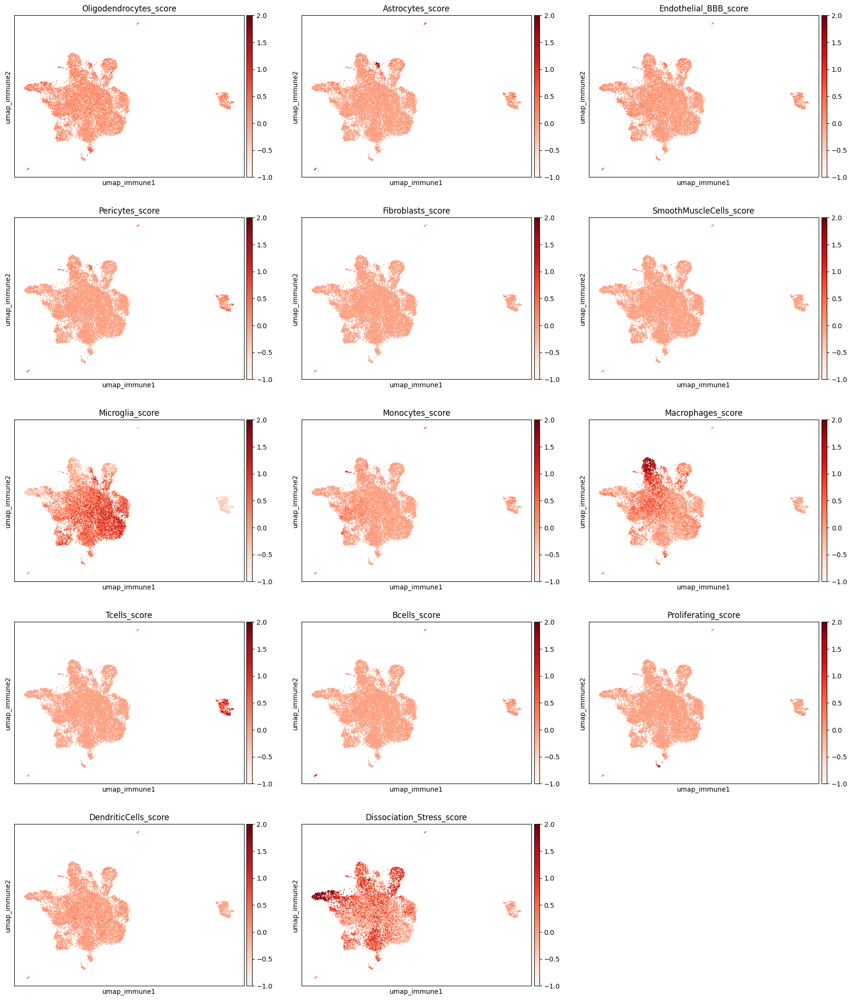

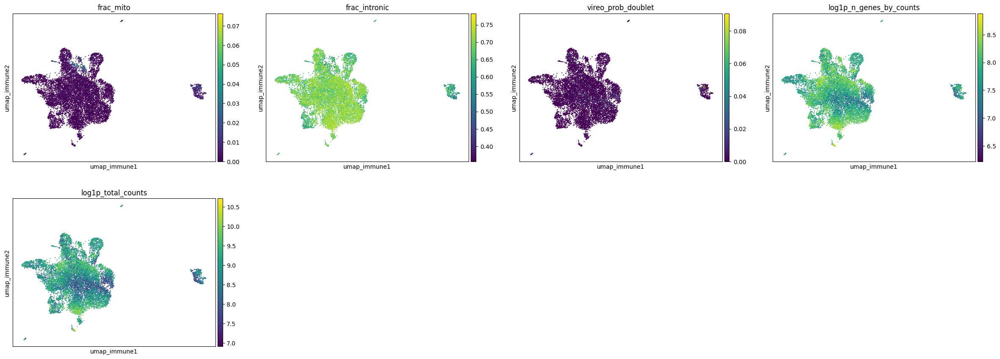

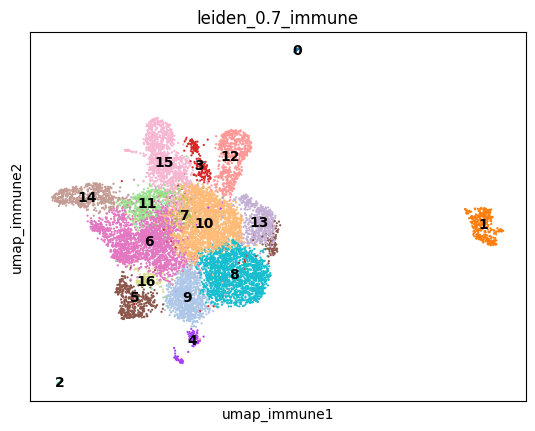

'\nIMMUNE\n    - Lymphocyte\n    - Macrophage\n    - Monocytes\n'

In [30]:
# Check for cell subtype markers

CLUSTERS_GROUP_ALL_CELLS_COL = f"leiden_0.7{NAME}"

# mmc cell types
#which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, MMC_ANNOTATION_LEVEL,CLEAN_THRESHOLD = 90)

# Wilcoxon
# res = preprocessing.rank_markers_per_cluster(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, layer="log1p_norm", n_genes=10, markers=markers_ct)
# for cluster, df in res.items():
#     print(f"Cluster {cluster}:")
#     display(df)

# gene markers score
col_scores = preprocessing.calculate_and_plot_markers(adata_nn, markers_ct, gene_col="gene_symbol", ncol=3, layer="log1p_norm", color_map="Reds", umap_name=f"umap{NAME}", vmin=-1, vmax=2)

# plot clusters
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=["frac_mito", "frac_intronic", "vireo_prob_doublet", "log1p_n_genes_by_counts", "log1p_total_counts"], legend_loc="on data")
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=CLUSTERS_GROUP_ALL_CELLS_COL, legend_loc="on data")

"""
IMMUNE
    - Lymphocyte
    - Macrophage
    - Monocytes
"""

### Final decision leave all as microglia

ct_for_deg
Oligodendrocyte         123374
Astrocyte                29405
Microglia                10209
OPC                       8155
Ependymal                 1491
Macrophages               1175
Endothelial_BBB            726
Pericytes                  553
Lymphocytes                386
Fibroblasts                231
SmoothMuscleCells          129
-Oligo_contamination        43
Name: count, dtype: int64


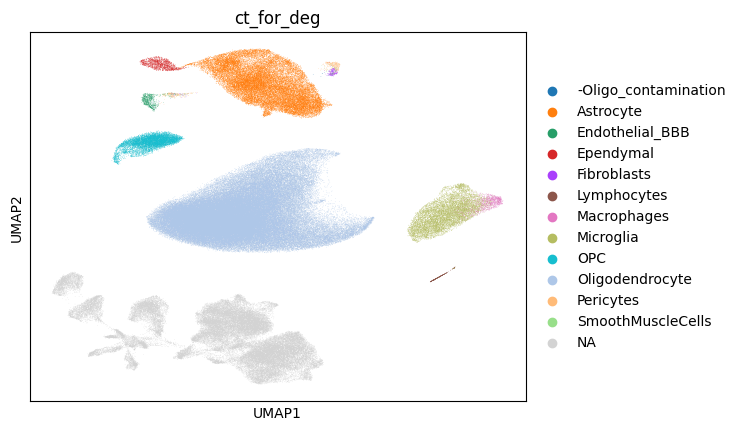

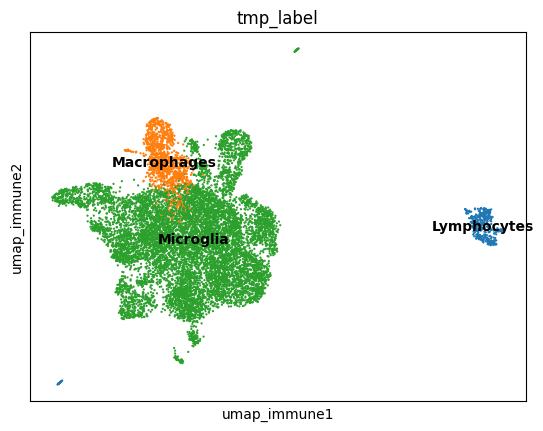

In [31]:
# map clusters to yout ct
mapping_dict = {
    "1": "Lymphocytes",
    "2": "Lymphocytes",

    "15": "Macrophages",
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict).fillna("Microglia") # map known clusters, and call the rest "Microglia" (based on marker genes and location in umap)

# Add to orignla ct
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align

print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg")
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="tmp_label", legend_loc="on data")


# Neurons

In [ ]:
# r=0.1
# #sc.tl.leiden(adata, resolution=r, key_added=f"leiden_{r}_all_cells", flavor="igraph", n_iterations=2) # use neighbors
# CLUSTERS_ALL_CELLS_COL = f"leiden_{r}_all_cells"
# sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL,legend_loc="on data")


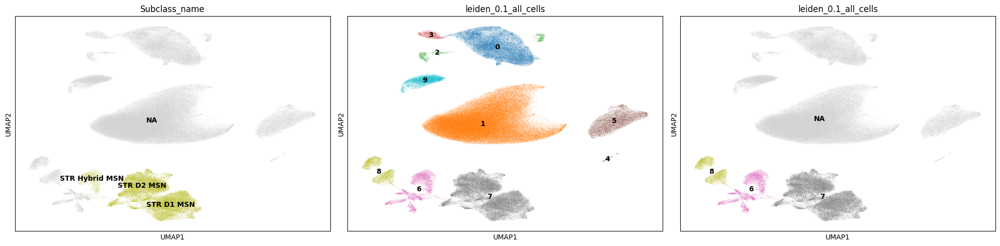

In [21]:
CLUSTERS_ALL_CELLS_COL = f"leiden_0.1_all_cells" # NEED SMALLER RESOLUTION
CLUSTERS_GROUP_ALL_CELLS =  ["6", "7", "8"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["MSN"]
NAME="_MSN"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

In [ ]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.3, 0.5], integrate_with_harmony=True, batch_key=SAMPLE_VARIABLE)

# map Group-name to broader categories
mapping_msn = {
    "STRd D1 Matrix MSN": "Matrix D1",
    "STRd D2 Matrix MSN": "Matrix D2",
    "STRv D1 MSN": "Matrix D1",
    "STRv D2 MSN": "Matrix D2",

    "STRd D2 Striosome MSN": "Patch D2",
    "STRd D1 Striosome MSN": "Patch D1",

    "STRd D2 StrioMat Hybrid MSN": "eMSN_StrioMat",
    "STR D1D2 Hybrid MSN": "eMSN_D1D2",
    "STRv D1 NUDAP MSN": "eMSN_NUDAP"
  }
adata_nn.obs["MSN_type"] = adata_nn.obs["Group_name"].map(mapping_msn)

Running HVG...
HVG computed with batch_key='donor_id'
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-11 19:18:58,140 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-11 19:18:58,141 - harmonypy - INFO -   Parameters:
2026-03-11 19:18:58,141 - harmonypy - INFO -     max_iter_harmony: 30
2026-03-11 19:18:58,142 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-11 19:18:58,142 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-11 19:18:58,143 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-11 19:18:58,144 - harmonypy - INFO -     nclust: 100
2026-03-11 19:18:58,144 - harmonypy - INFO -     block_size: 0.05
2026-03-11 19:18:58,145 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-03-11 19:18:58,146 - harmonypy - INFO -     theta: [2. 2. 2. 2

In [5]:
#adata.write_h5ad("/home/gdallagl/myworkdir/XDP/data/_tmp/nucseq_ct.h5ad")
#adata = sc.read_h5ad("/home/gdallagl/myworkdir/XDP/data/_tmp/nucseq_ct.h5ad")

Assure that adata.var.index has same gene name of makers...


  0%|          | 0/1 [00:00<?, ?it/s]

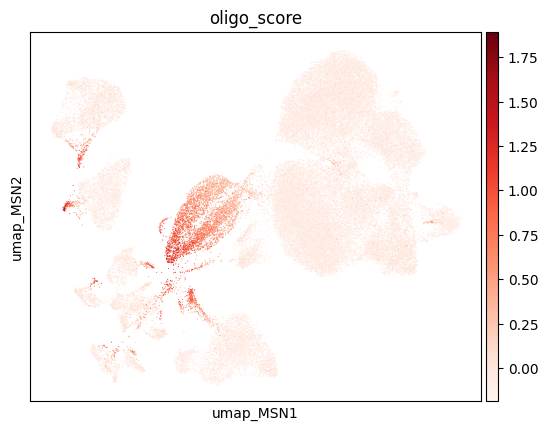

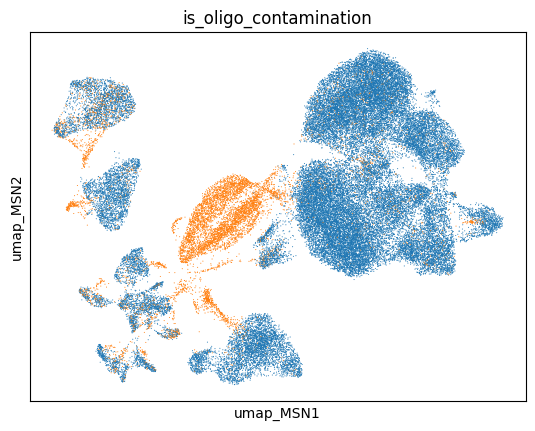

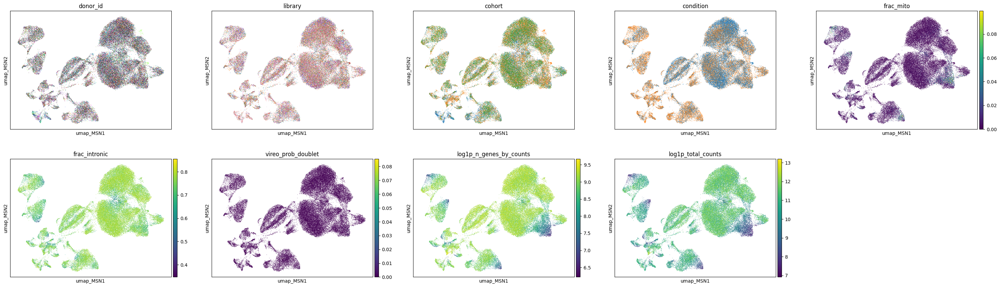

In [24]:
# Invstrigate why MSN spit in differt clusters

# Check if they are ooligos contamiantion
dict_oligo={"oligo": ["MBP", "SOX10", 'TF', 'PLP1', 'MOBP', 'TMEM144', "MOG", "MAG", "OPALIN", "ABCA8"]}
col_oligo_score = preprocessing.calculate_and_plot_markers(adata_nn, dict_oligo, gene_col="gene_symbol", ncol=3, layer="log1p_norm", color_map="Reds", umap_name="umap_MSN")

adata_nn.obs["is_oligo_contamination"] = (adata_nn.obs[col_oligo_score[0]] >= 0).fillna(0).astype(bool)
#adata_nn.obs[col_oligo_score[0]].plot(kind="hist", bins=100)
sc.pl.embedding(adata_nn, color="is_oligo_contamination", basis="umap_MSN", ncols=5, legend_loc=None)

toplot = [
          SAMPLE_VARIABLE, "library", "cohort", "condition",
          "frac_mito", "frac_intronic", "vireo_prob_doublet", "log1p_n_genes_by_counts", "log1p_total_counts"]
sc.pl.embedding(adata_nn, color=toplot, basis="umap_MSN", ncols=5, legend_loc=None)

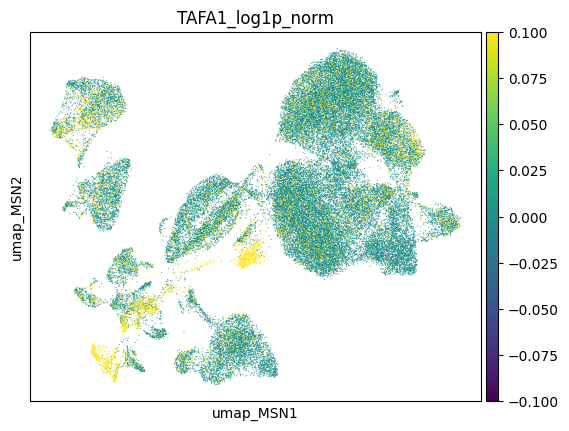

In [25]:
#which_clusters_are_split(adata_nn, CLUSTERS_GROUP_ALL_CELLS_COL, "MSN_type", CLEAN_THRESHOLD = 90)

idx_tafa1 = adata_nn.var.index.get_indexer(adata_nn.var.query("gene_symbol == 'TAFA1'").index)
adata_nn.obs["TAFA1_log1p_norm"] = adata_nn.layers["log1p_norm"][:, idx_tafa1].toarray().ravel()
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=["TAFA1_log1p_norm"], ncols=2, vmax=np.quantile(adata_nn.obs["TAFA1_log1p_norm"].values, 0.2))

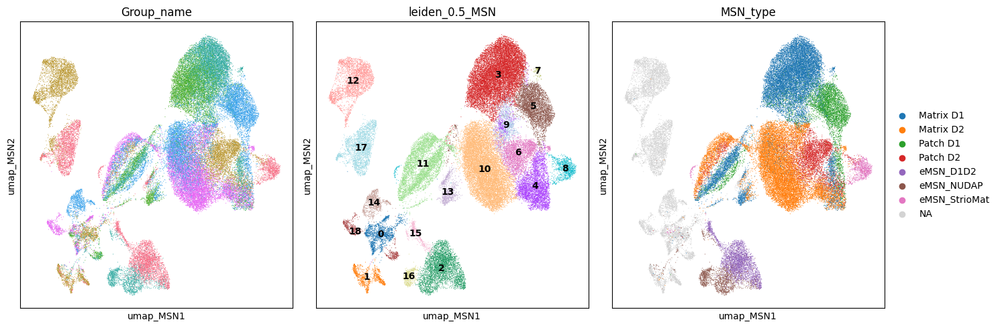

In [29]:
CLUSTERS_GROUP_ALL_CELLS_COL=f"leiden_0.5_MSN"


legend_locs = [None, "on data", "right margin"]
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, col, loc in zip(axes, ["Group_name", CLUSTERS_GROUP_ALL_CELLS_COL, "MSN_type"], legend_locs):
    sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=col, 
                    legend_loc=loc, ax=ax, show=False)
plt.tight_layout()
plt.show()

### Final decision

usual splot by unsueprvised clusters

Give spscific label --> all rest in non_MSN

but flag oligo contamination

ct_for_deg
Oligodendrocyte         123374
Neuron_non_MSN           42402
Astrocyte                29405
Microglia                10209
-Oligo_contamination      8286
OPC                       8155
-low_quality_MSN          3769
Ependymal                 1491
Macrophages               1175
-TAFA1                     789
Endothelial_BBB            726
Pericytes                  553
Lymphocytes                386
Fibroblasts                231
SmoothMuscleCells          129
Name: count, dtype: int64


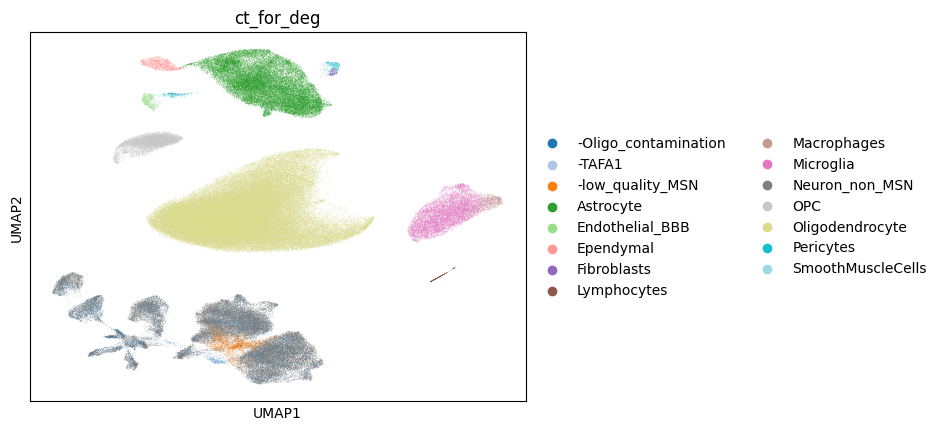

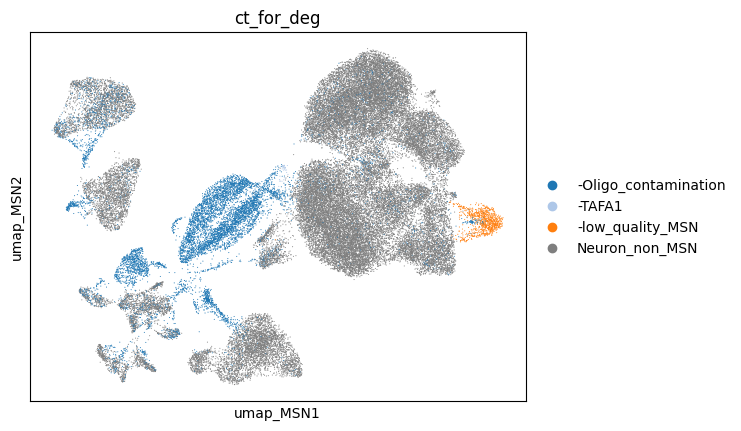

In [30]:

# map clusters to yout ct
mapping_dict = {

    "13": "-TAFA1",

    "11": "-Oligo_contamination", 

    "4": "-low_quality_MSN"
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict).fillna("Neuron_non_MSN")
adata_nn.obs.loc[adata_nn.obs["is_oligo_contamination"], "tmp_label"] = "-Oligo_contamination"


# Add to orignla ct
if "ct_for_deg" not in adata.obs.columns:
    adata.obs["ct_for_deg"] = np.nan
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg", palette="tab20")
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="ct_for_deg")

In [31]:
del adata_nn

# MSN

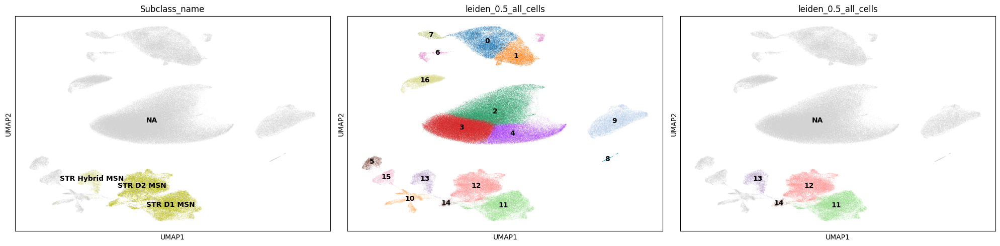

In [32]:
CLUSTERS_ALL_CELLS_COL = f"leiden_0.5_all_cells" # NEED SMALLER RESOLUTION
CLUSTERS_GROUP_ALL_CELLS =  ["11", "12", "14", "13"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["MSN"]
NAME="_MSN"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

In [33]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[
    (adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)) &
    (~adata.obs["ct_for_deg"].isin(["-Oligo_contamination", "-TAFA1", "-low_quality_MSN"]))  # exclude known contaminations 
    ].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.3, 0.5], integrate_with_harmony=True, batch_key=SAMPLE_VARIABLE)

# map Group-name to broader categories
mapping_msn = {
    "STRd D1 Matrix MSN": "Matrix D1",
    "STRd D2 Matrix MSN": "Matrix D2",
    "STRv D1 MSN": "Matrix D1",
    "STRv D2 MSN": "Matrix D2",

    "STRd D2 Striosome MSN": "Patch D2",
    "STRd D1 Striosome MSN": "Patch D1",

    "STRd D2 StrioMat Hybrid MSN": "eMSN_StrioMat",
    "STR D1D2 Hybrid MSN": "eMSN_D1D2",
    "STRv D1 NUDAP MSN": "eMSN_NUDAP"
  }
adata_nn.obs["MSN_type"] = adata_nn.obs["Group_name"].map(mapping_msn)

Running HVG...
HVG computed with batch_key='donor_id'
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-11 19:24:45,223 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-11 19:24:45,224 - harmonypy - INFO -   Parameters:
2026-03-11 19:24:45,225 - harmonypy - INFO -     max_iter_harmony: 30
2026-03-11 19:24:45,225 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-11 19:24:45,226 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-11 19:24:45,226 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-11 19:24:45,227 - harmonypy - INFO -     nclust: 100
2026-03-11 19:24:45,227 - harmonypy - INFO -     block_size: 0.05
2026-03-11 19:24:45,228 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-03-11 19:24:45,229 - harmonypy - INFO -     theta: [2. 2. 2. 2

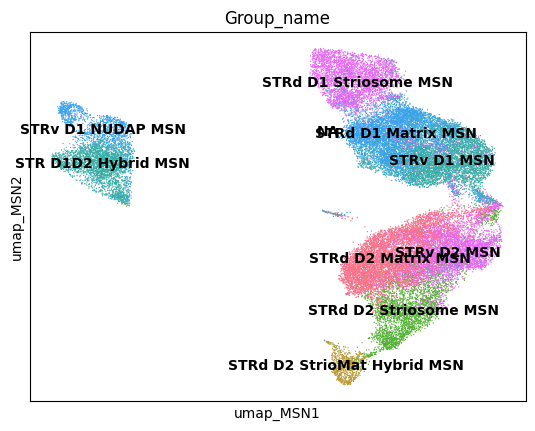

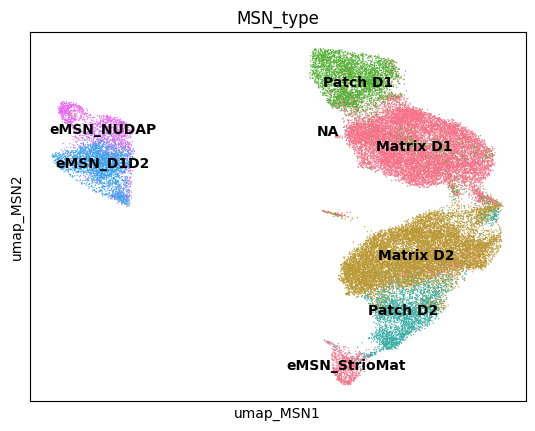

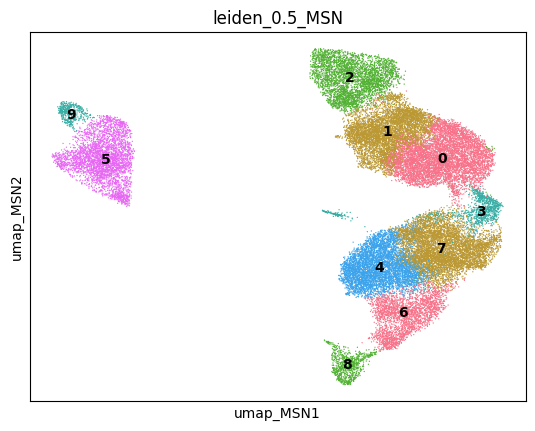

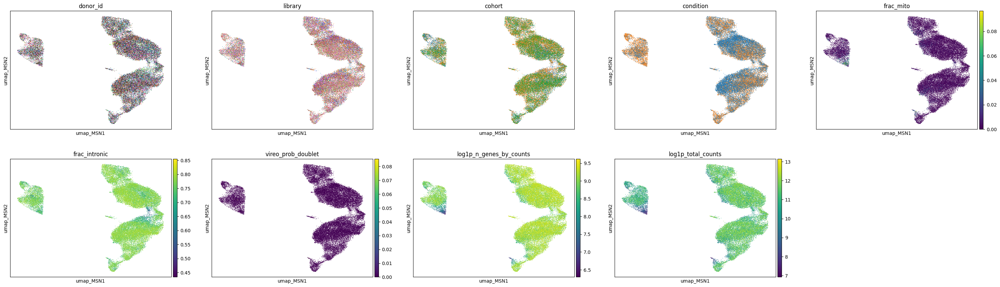

In [34]:
sc.pl.embedding(adata_nn, color="Group_name", basis="umap_MSN", palette=sns.color_palette("husl"), groups=mapping_msn.keys(), legend_loc="on data")
sc.pl.embedding(adata_nn, color="MSN_type", basis="umap_MSN", palette=sns.color_palette("husl"), legend_loc="on data")
CLUSTERS_GROUP_ALL_CELLS_COL=f"leiden_0.5_MSN"
sc.pl.embedding(adata_nn, color=CLUSTERS_GROUP_ALL_CELLS_COL, basis="umap_MSN", palette=sns.color_palette("husl"), legend_loc="on data")


toplot = [
          SAMPLE_VARIABLE, "library", "cohort", "condition",
          "frac_mito", "frac_intronic", "vireo_prob_doublet", "log1p_n_genes_by_counts", "log1p_total_counts"]
sc.pl.embedding(adata_nn, color=toplot, basis="umap_MSN", ncols=5, legend_loc=None)

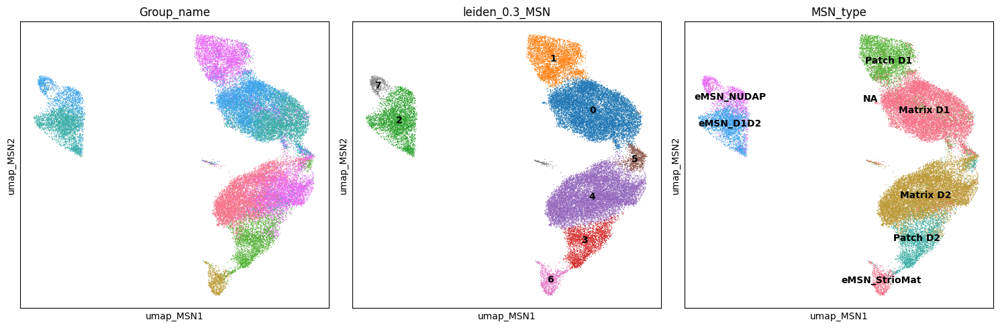

In [39]:
CLUSTERS_GROUP_ALL_CELLS_COL=f"leiden_0.3_MSN"


legend_locs = [None, "on data", "on data"]
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
for ax, col, loc in zip(axes, ["Group_name", CLUSTERS_GROUP_ALL_CELLS_COL, "MSN_type"], legend_locs):
    sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color=col, 
                    legend_loc=loc, ax=ax, show=False)
plt.tight_layout()
plt.show()

# Final Decision

ct_for_deg
Oligodendrocyte         123374
Astrocyte                29405
Matrix D2                11504
Matrix D1                11459
Microglia                10209
-Oligo_contamination      8286
OPC                       8155
Neuron_non_MSN            7184
-low_quality_MSN          4581
Patch D1                  3817
eMSN_D1D2                 3693
Patch D2                  2512
Ependymal                 1491
Macrophages               1175
eMSN_StrioMat              870
-TAFA1                     789
Endothelial_BBB            726
Pericytes                  553
eMSN_NUDAP                 551
Lymphocytes                386
Fibroblasts                231
SmoothMuscleCells          129
Name: count, dtype: int64


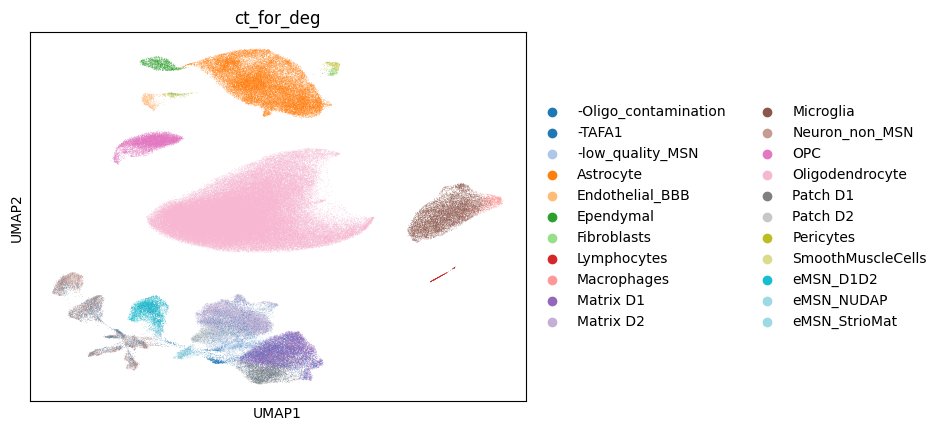

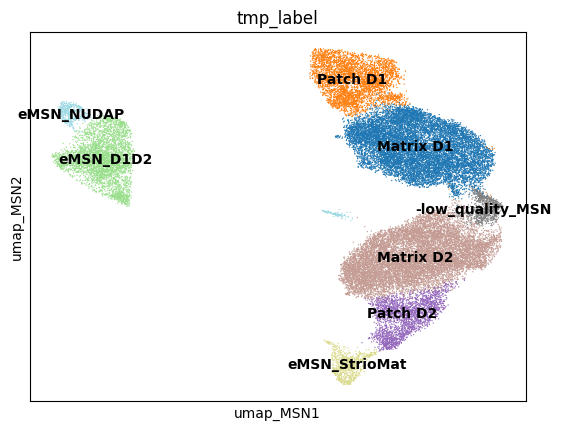

In [43]:

# map clusters to yout ct
mapping_dict = {

    "0": "Matrix D1",
    "1": "Patch D1",
    "2": "eMSN_D1D2",
    "3": "Patch D2",    
    "4": "Matrix D2",   
    "5": "-low_quality_MSN",
    "6": "eMSN_StrioMat",
    "7": "eMSN_NUDAP"
}
adata_nn.obs["tmp_label"] = adata_nn.obs[CLUSTERS_GROUP_ALL_CELLS_COL].map(mapping_dict)


# Add to orignla ct
if "ct_for_deg" not in adata.obs.columns:
    adata.obs["ct_for_deg"] = np.nan
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs.loc[adata_nn.obs_names, "ct_for_deg"] = adata_nn.obs["tmp_label"] # loc align


print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg", palette="tab20")
sc.pl.embedding(adata_nn, basis=f"umap{NAME}", color="tmp_label", palette="tab20", legend_loc="on data")

# All rest

In [44]:
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].astype(object)
adata.obs["ct_for_deg"] = adata.obs["ct_for_deg"].fillna("-unassigned")

# Save

In [47]:
adata.write_h5ad(SAVE_PATH)

In [4]:
adata = sc.read_h5ad(SAVE_PATH)

# Check orignal cell type distirbution

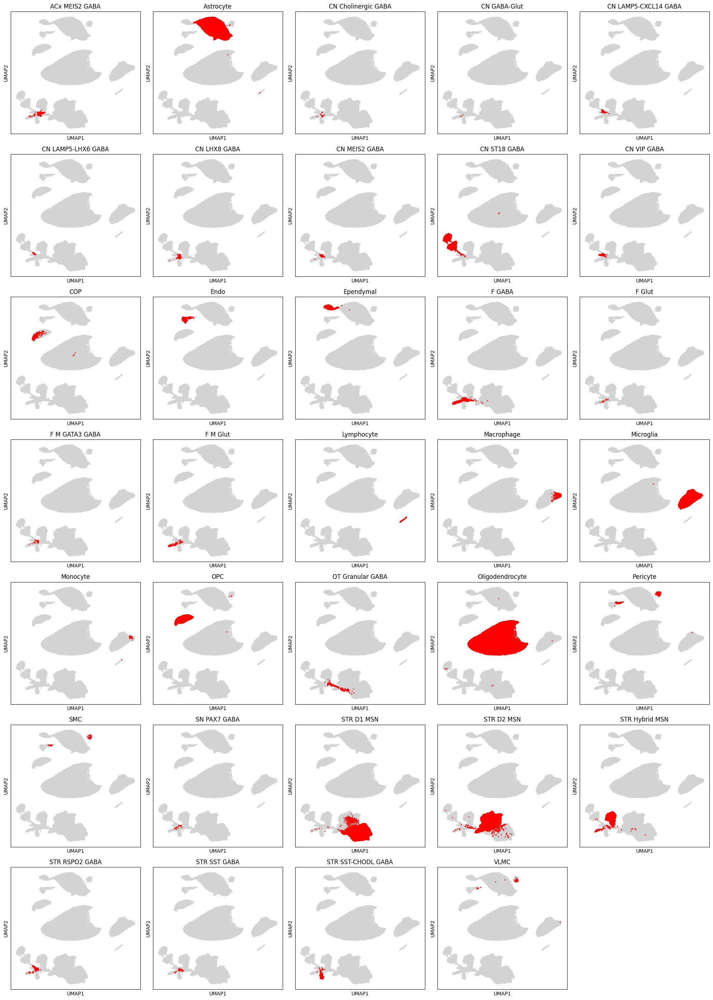

In [40]:
cts = adata.obs["Subclass_name"].cat.categories
n_cols = 5
n_rows = int(np.ceil(len(cts) / n_cols))

adata.uns["Subclass_name_colors"] = ["red"] * len(adata.obs["Subclass_name"].cat.categories)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(4*n_cols, 4*n_rows))
axes = axes.flatten()

for ax, ct in zip(axes, cts):
    sc.pl.umap(adata, color="Subclass_name", groups=[ct], ax=ax, show=False, size=20,
               title=ct, legend_loc=None, na_color="#d3d3d3")

# hide empty axes
for ax in axes[len(cts):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

# Final Checks

In [45]:
palette=[
    "#e6194b", "#3cb44b", "#4363d8", "#f58231", "#911eb4",
    "#42d4f4", "#f032e6", "#bfef45", "#fabed4", "#469990",
    "#dcbeff", "#9a6324", "#800000", "#aaffc3", "#000075",
    "#a9a9a9", "#ffffff", "#000000", "#ffe119", "#ffd8b1"
]

ct_for_deg
Oligodendrocyte         123374
Astrocyte                29405
Matrix D2                11504
Matrix D1                11459
Microglia                10209
-Oligo_contamination      8286
OPC                       8155
Neuron_non_MSN            7184
-low_quality_MSN          4581
Patch D1                  3817
eMSN_D1D2                 3693
Patch D2                  2512
Ependymal                 1491
Macrophages               1175
eMSN_StrioMat              870
-TAFA1                     789
Endothelial_BBB            726
Pericytes                  553
eMSN_NUDAP                 551
Lymphocytes                386
Fibroblasts                231
SmoothMuscleCells          129
Name: count, dtype: int64


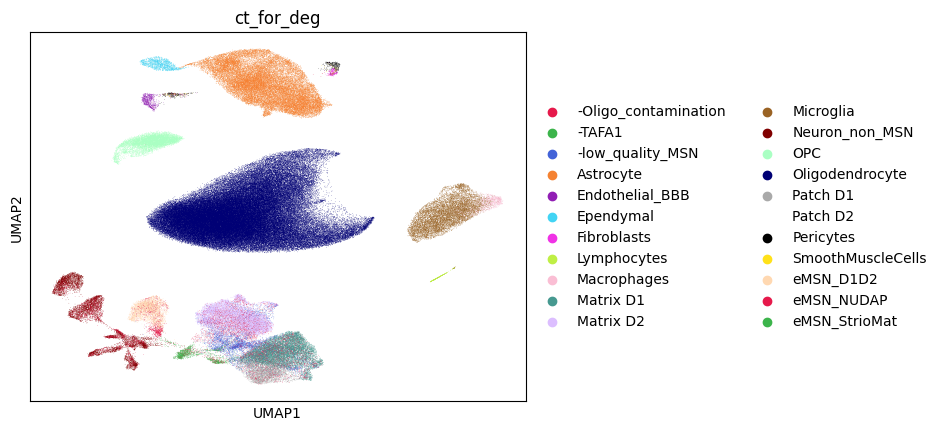

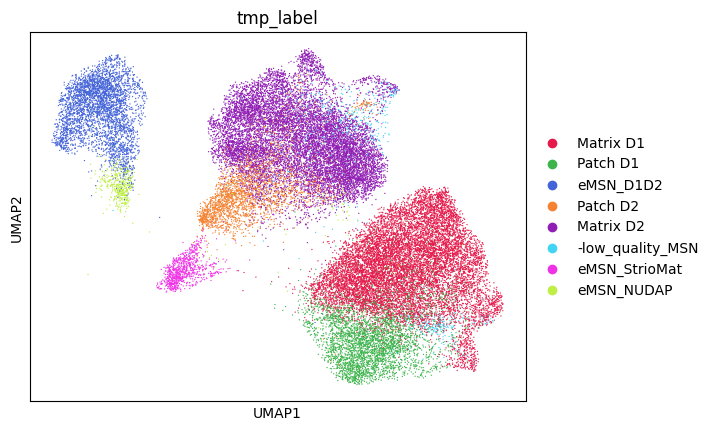

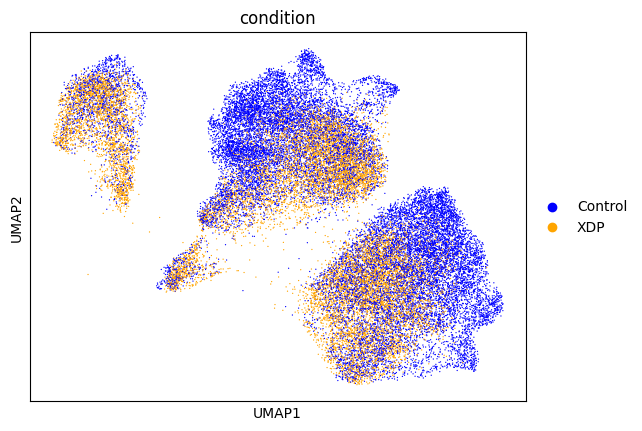

In [46]:
print(adata.obs["ct_for_deg"].value_counts())
sc.pl.umap(adata, color="ct_for_deg", palette=palette)

#adata_nn = adata[adata.obs["leiden_0.1_all_cells"].isin(["6", "7", "8"])]
sc.pl.umap(adata_nn, color="tmp_label", palette=palette)
sc.pl.umap(adata_nn, color="condition", palette={"Control": "blue", "XDP": "orange"})

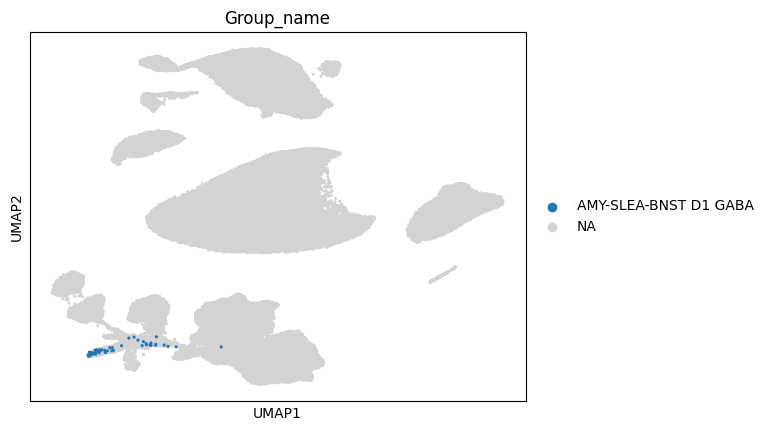

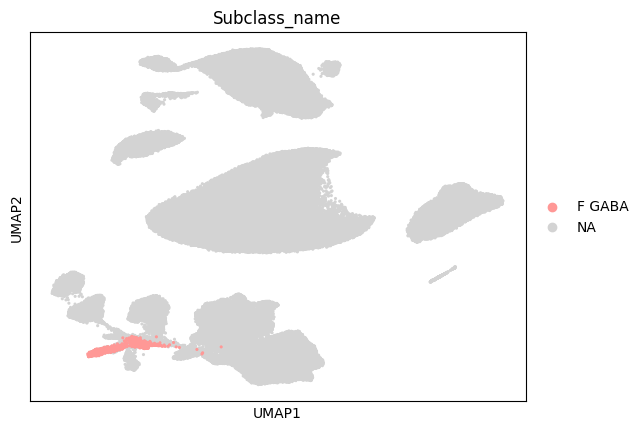

In [44]:

sc.pl.umap(adata, color="Group_name", groups="AMY-SLEA-BNST D1 GABA", size=20, palette="tab20")
sc.pl.umap(adata, color="Subclass_name", groups="F GABA", size=20, palette="tab20")

# ---

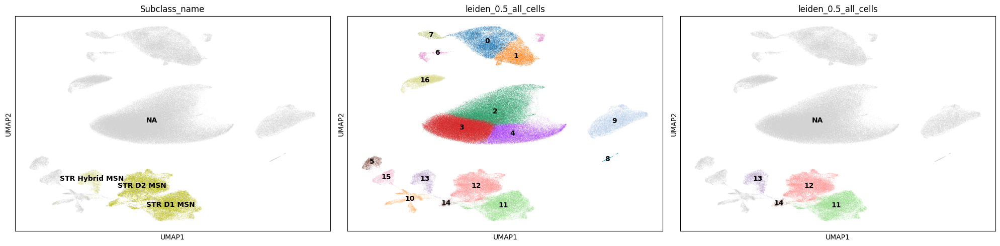

In [29]:
CLUSTERS_ALL_CELLS_COL = f"leiden_0.5_all_cells" # NEED SMALLER RESOLUTION
CLUSTERS_GROUP_ALL_CELLS =  ["11", "12", "14", "13"]
MMC_ANNOTATION_LEVEL = "Subclass_name"
GROUP_LABELS = subclass_cell_types_mapping["MSN"]
NAME="_MSN"

# to help  picking clusters
fig, ax = plt.subplots(1, 3, figsize=(20,5))
sc.pl.umap(adata, color="Subclass_name", groups=GROUP_LABELS, ax=ax[0], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, ax=ax[1], show=False, legend_loc="on data")
sc.pl.umap(adata, color=CLUSTERS_ALL_CELLS_COL, groups=CLUSTERS_GROUP_ALL_CELLS, ax=ax[2], show=False, legend_loc="on data")
plt.tight_layout(); plt.show()

In [30]:
# Select clear nn clusters (use cluster created using all cells)
adata_nn = adata[
    (adata.obs[CLUSTERS_ALL_CELLS_COL].isin(CLUSTERS_GROUP_ALL_CELLS)) &
    (~adata.obs["ct_for_deg"].isin(["-Oligo_contamination", "-TAFA1", "-low_quality_MSN"]))  # exclude known contaminations 
    ].copy()

# rerun analsys
leiden_cluster_names = preprocess_common_pipeline(adata_nn, umap_name=NAME, leiden_name=NAME, resolutions = [0.1, 0.3, 0.5], integrate_with_harmony=True, batch_key=SAMPLE_VARIABLE)

# map Group-name to broader categories
mapping_msn = {
    "STRd D1 Matrix MSN": "Matrix D1",
    "STRd D2 Matrix MSN": "Matrix D2",
    "STRv D1 MSN": "Matrix D1",
    "STRv D2 MSN": "Matrix D2",

    "STRd D2 Striosome MSN": "Patch D2",
    "STRd D1 Striosome MSN": "Patch D1",

    "STRd D2 StrioMat Hybrid MSN": "eMSN_StrioMat",
    "STR D1D2 Hybrid MSN": "eMSN_D1D2",
    "STRv D1 NUDAP MSN": "eMSN_NUDAP"
  }
adata_nn.obs["MSN_type"] = adata_nn.obs["Group_name"].map(mapping_msn)

Running HVG...
HVG computed with batch_key='donor_id'
Running Harmony...


/home/gdallagl/.pyenv/versions/3.11.8/lib/python3.11/functools.py:909: UserWarning: zero-centering a sparse array/matrix densifies it.
  return dispatch(args[0].__class__)(*args, **kw)
2026-03-11 16:52:26,295 - harmonypy - INFO - Running Harmony (PyTorch on cuda)
2026-03-11 16:52:26,296 - harmonypy - INFO -   Parameters:
2026-03-11 16:52:26,296 - harmonypy - INFO -     max_iter_harmony: 30
2026-03-11 16:52:26,297 - harmonypy - INFO -     max_iter_kmeans: 20
2026-03-11 16:52:26,297 - harmonypy - INFO -     epsilon_cluster: 1e-05
2026-03-11 16:52:26,298 - harmonypy - INFO -     epsilon_harmony: 0.0001
2026-03-11 16:52:26,298 - harmonypy - INFO -     nclust: 100
2026-03-11 16:52:26,299 - harmonypy - INFO -     block_size: 0.05
2026-03-11 16:52:26,300 - harmonypy - INFO -     lamb: [1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
2026-03-11 16:52:26,301 - harmonypy - INFO -     theta: [2. 2. 2. 2

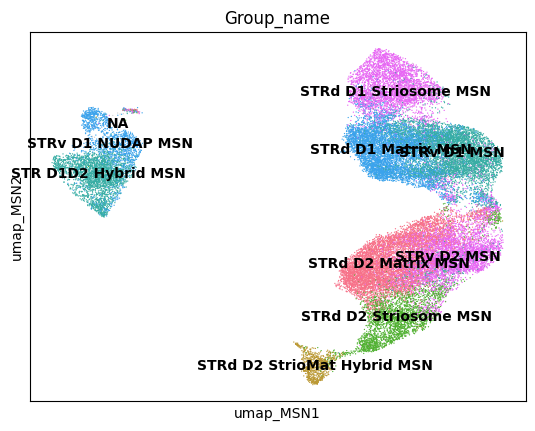

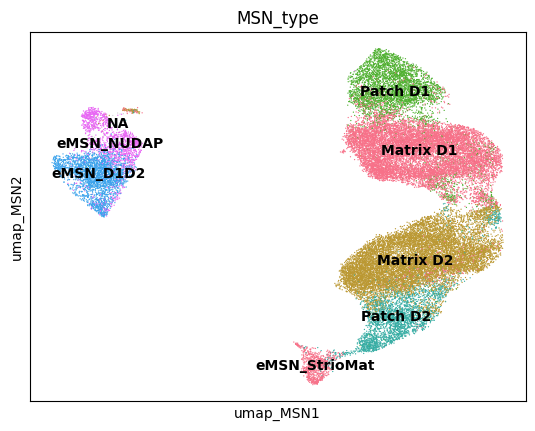

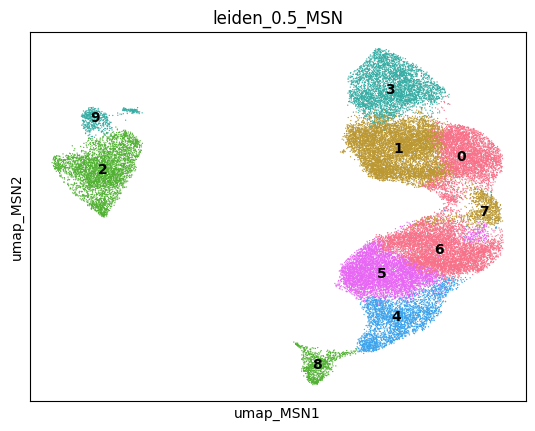

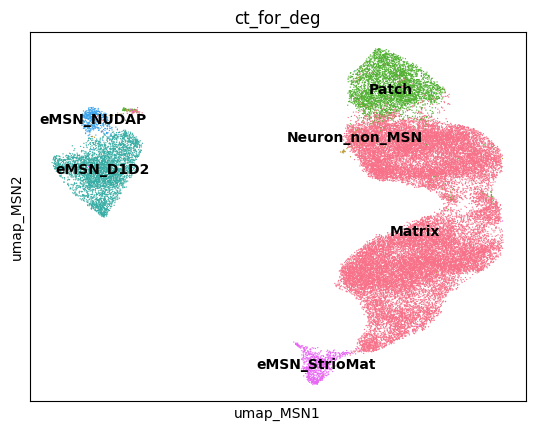

In [31]:
sc.pl.embedding(adata_nn, color="Group_name", basis="umap_MSN", palette=sns.color_palette("husl"), groups=mapping_msn.keys(), legend_loc="on data")
sc.pl.embedding(adata_nn, color="MSN_type", basis="umap_MSN", palette=sns.color_palette("husl"), legend_loc="on data")
CLUSTERS_GROUP_ALL_CELLS_COL=f"leiden_0.5_MSN"
sc.pl.embedding(adata_nn, color=CLUSTERS_GROUP_ALL_CELLS_COL, basis="umap_MSN", palette=sns.color_palette("husl"), legend_loc="on data")
sc.pl.embedding(adata_nn, color="ct_for_deg", basis="umap_MSN", palette=sns.color_palette("husl"), legend_loc="on data")


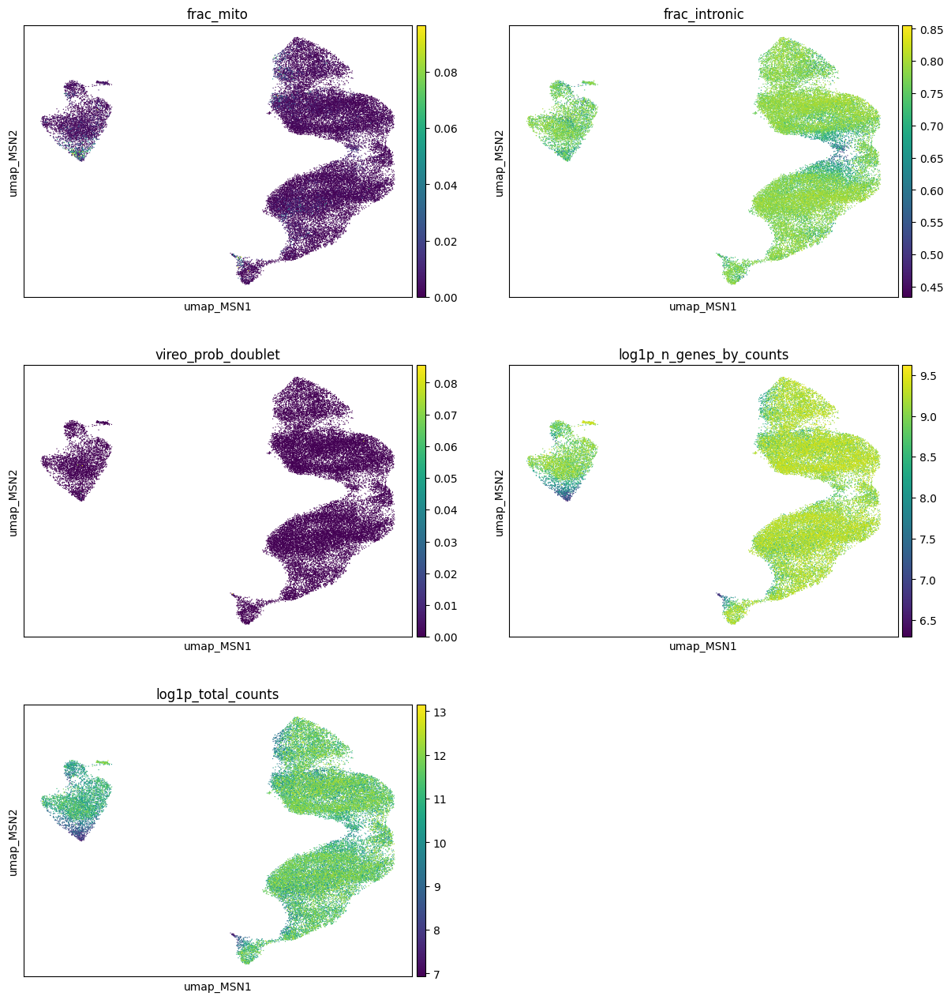

In [33]:
toplot = [
          "frac_mito", "frac_intronic", "vireo_prob_doublet", "log1p_n_genes_by_counts", "log1p_total_counts"]
sc.pl.embedding(adata_nn, color=toplot, basis="umap_MSN", ncols=2, legend_loc=None)